In [1]:
# import nedded libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
import skimage.exposure
from numpy import asarray

In [2]:
# arrays to save image in each step
brigthened = []
contrast = []
removed_noise = []
blur = []
hsv = []
masked = []
contours = []

In [3]:
# increase brightness
def brighten_img(img):
    global brigthened
    # increasing brightness  
    img_brightned = skimage.exposure.rescale_intensity(img,in_range=(1,40), out_range=(0,180))
    
    # add image to array
    brigthened.append(img_brightned)
    
    return img_brightned



In [4]:
# increase contrast
def increase_contrast(img_brightned):
    
    global contrast
    
    # converting to LAB color space
    lab= cv2.cvtColor(img_brightned.astype(np.uint8), cv2.COLOR_BGR2LAB)
    l_channel, a, b = cv2.split(lab)

    # Applying CLAHE to L-channel
    clahe = cv2.createCLAHE(clipLimit=4, tileGridSize=(8,8))
    cl = clahe.apply(l_channel)

    # merge the CLAHE enhanced L-channel with the a and b channel
    limg = cv2.merge((cl,a,b))

    # Converting image from LAB to BGR 
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    
    # add image to array
    contrast.append(enhanced_img)
    
    return enhanced_img

In [5]:
# remove noise
def remove_noise(enhanced_img):
    global removed_noise
    
    noiseless_image_colored = cv2.fastNlMeansDenoisingColored(enhanced_img,None,10,10,5,10) 
    
    # add image to array
    removed_noise.append(noiseless_image_colored)
    
    return noiseless_image_colored

In [6]:
def find_biggest_contour(image):
    
    
    # Find contours from the mask
    contours, hierarchy = cv2.findContours(image, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    
    biggest_contour = max(contours, key=cv2.contourArea)
    
    mask = np.zeros(image.shape, np.uint8)
    
    cv2.drawContours(mask, [biggest_contour], -1, 255, -1)
    
    return mask



def segmentation(noiseless_image_colored):
    global blur
    global hsv
    global masked
    global contours
    
    image_blur = cv2.GaussianBlur(noiseless_image_colored, (7, 7), 0)

    # convert to hsv
    image_blur_hsv = cv2.cvtColor(image_blur, cv2.COLOR_RGB2HSV)

    # lower bound and upper bound for color 
    lower_bound = np.array([50, 50, 100])
    upper_bound = np.array([255, 255, 255])

    # find the colors within the boundaries 
    mask = cv2.inRange(image_blur_hsv, lower_bound, upper_bound)

    # removing extra objects by getting only desired areas
    masked_img = find_biggest_contour(mask)

    # adding images to arrays
    blur.append(image_blur)
    hsv.append(image_blur_hsv)
    masked.append(mask)
    contours.append(masked_img)

    return masked_img



In [7]:
# arrays 
images = [] # array for images read from Dataset_Pre folder 
output = [] # array for images resulted from segmentation
images2 = [] # array for images read from Segmentation_Ground_Truth folder 
iou_scores = [] # array for iou score of each image

In [8]:
def run(path,path2,start,end,start_output,end_output):
    global images
    global output
    global images2
    
    # reading images and adding them to images array
    for i in range (start,end):
        x = str(i+1)
        n = cv2.imread(path+x+".bmp")
        images.append(n)


    # adding segmented images to output array
    for i in range(start_output,end_output):
        # increase brightness
        img_brightned = brighten_img(images[i])
        # increase contrast
        img_enhanced = increase_contrast(img_brightned)
        # remove noise
        img_noiseless= remove_noise(img_enhanced)
        # segmenation process
        mask = segmentation(img_noiseless)
        output.append(mask)


    

    # reading images and adding them to images2 array
    for i in range (start,end):
        x = str(i+1)
        img = cv2.imread(path2+x+".bmp")
        # image is converted to gray 
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        images2.append(asarray(gray))
        
    # adding iou of each image to array  
    for i in range(start_output,end_output):
        intersection = np.logical_and(images2[i], output[i])
        union = np.logical_or(images2[i], output[i])
        iou_score = np.sum(intersection) / np.sum(union)
        iou_scores.append(iou_score)    

In [9]:
def get_iou():
    total = 0
    global iou_scores
    for i in range(len(iou_scores)):
        total = total + iou_scores[i]

    avg = total / len(iou_scores)

    return avg

In [10]:
def main():
    # baso
    run('C:/Users/mariam/Desktop/semster 7/digital image processing/12th project/Dataset_Pre/output_pre/baso/','C:/Users/mariam/Desktop/semster 7/digital image processing/12th project/Segmentation_Ground_Truth/output/baso/',0,53,0,53)
    # eosi
    run('C:/Users/mariam/Desktop/semster 7/digital image processing/12th project/Dataset_Pre/output_pre/eosi/','C:/Users/mariam/Desktop/semster 7/digital image processing/12th project/Segmentation_Ground_Truth/output/eosi/',0,39,53,92)
    # lymp
    run('C:/Users/mariam/Desktop/semster 7/digital image processing/12th project/Dataset_Pre/output_pre/lymp/','C:/Users/mariam/Desktop/semster 7/digital image processing/12th project/Segmentation_Ground_Truth/output/lymp/',0,52,92,144)
    # mixt
    run('C:/Users/mariam/Desktop/semster 7/digital image processing/12th project/Dataset_Pre/output_pre/mixt/','C:/Users/mariam/Desktop/semster 7/digital image processing/12th project/Segmentation_Ground_Truth/output/mixt/',0,8,144,152)
    # mono
    run('C:/Users/mariam/Desktop/semster 7/digital image processing/12th project/Dataset_Pre/output_pre/mono/','C:/Users/mariam/Desktop/semster 7/digital image processing/12th project/Segmentation_Ground_Truth/output/mono/',0,48,152,200)
    # neut
    run('C:/Users/mariam/Desktop/semster 7/digital image processing/12th project/Dataset_Pre/output_pre/neut/','C:/Users/mariam/Desktop/semster 7/digital image processing/12th project/Segmentation_Ground_Truth/output/neut/',0,50,200,250)
    # iou
    print("IOU for all images : "+str(get_iou()))

In [11]:
main()

IOU for all images : 0.7458297282150945


Text(0.5, 1.0, 'remove noise')

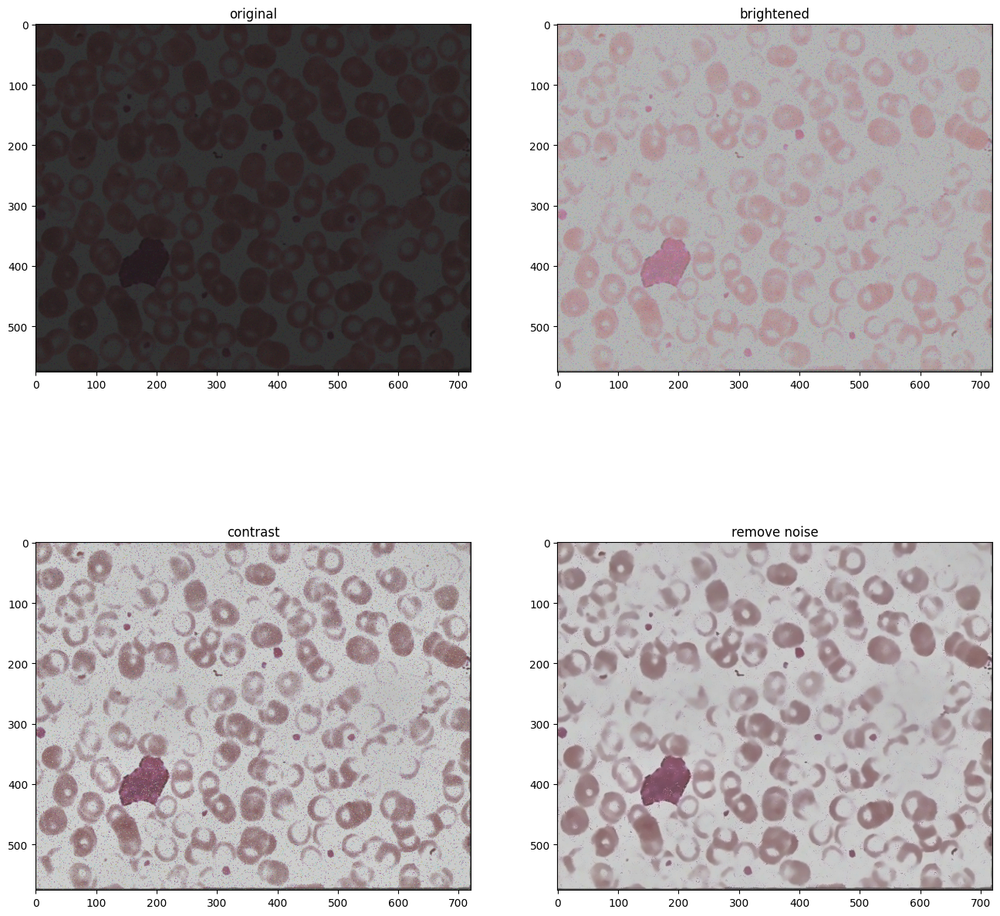

In [38]:
# displaying state of image in each step
# plotting images
plt.figure(figsize=(16, 16))

# orginal image
plt.subplot(2,2,1)
plt.imshow(images[1])
plt.title("original")

# brightned image
plt.subplot(2,2,2)
plt.imshow(brigthened[1].astype(np.uint8))
plt.title("brightened")

# orginal image
plt.subplot(2,2,3)
plt.imshow(contrast[1])
plt.title("contrast")

# brightned image
plt.subplot(2,2,4)
plt.imshow(removed_noise[1].astype(np.uint8))
plt.title("remove noise")


Text(0.5, 1.0, 'contours')

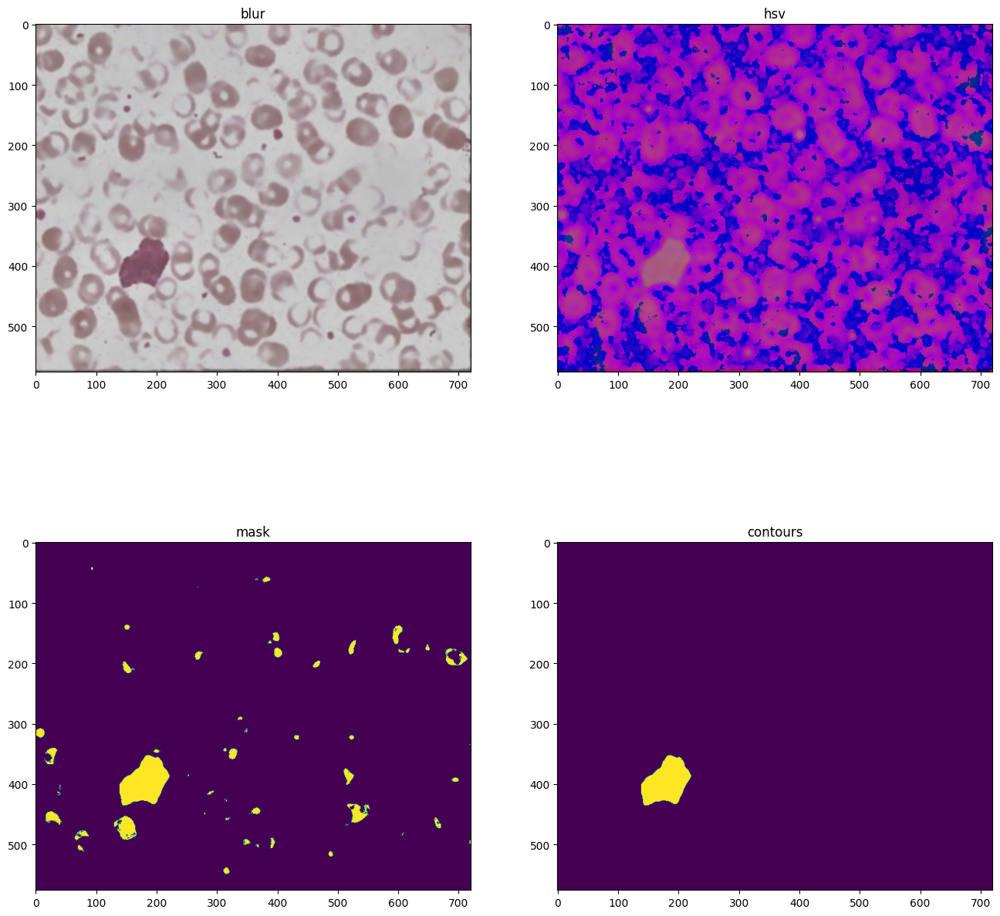

In [39]:

# plotting images
plt.figure(figsize=(16, 16))

# orginal image
plt.subplot(2,2,1)
plt.imshow(blur[1].astype(np.uint8))
plt.title("blur")

# brightned image
plt.subplot(2,2,2)
plt.imshow(hsv[1].astype(np.uint8))
plt.title("hsv")

# orginal image
plt.subplot(2,2,3)
plt.imshow(masked[1].astype(np.uint8))
plt.title("mask")

# brightned image
plt.subplot(2,2,4)
plt.imshow(contours[1].astype(np.uint8))
plt.title("contours")

Text(0.5, 1.0, 'output')

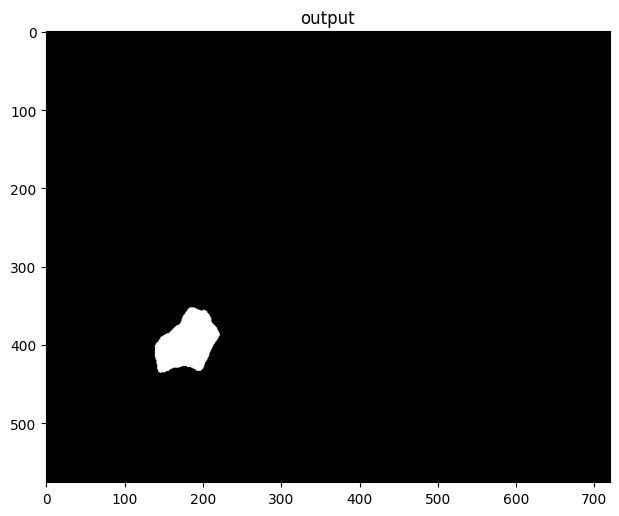

In [40]:
# final output
plt.figure(figsize=(16, 16))

# orginal image
plt.subplot(2,2,1)
plt.imshow(output[1].astype(np.uint8),cmap='gray')
plt.title("output")

Text(0.5, 1.0, 'remove noise')

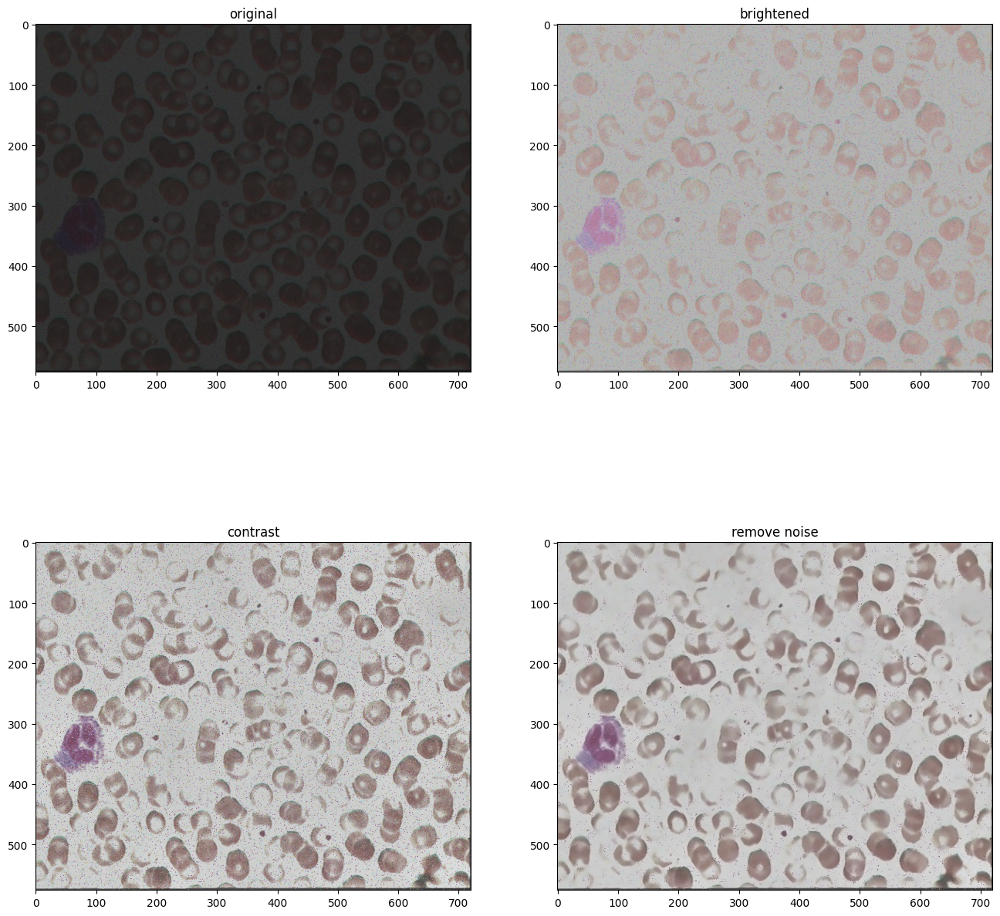

In [41]:
# displaying state of image in each step
# plotting images
plt.figure(figsize=(16, 16))

# orginal image
plt.subplot(2,2,1)
plt.imshow(images[55])
plt.title("original")

# brightned image
plt.subplot(2,2,2)
plt.imshow(brigthened[55].astype(np.uint8))
plt.title("brightened")

# orginal image
plt.subplot(2,2,3)
plt.imshow(contrast[55])
plt.title("contrast")

# brightned image
plt.subplot(2,2,4)
plt.imshow(removed_noise[55].astype(np.uint8))
plt.title("remove noise")

Text(0.5, 1.0, 'contours')

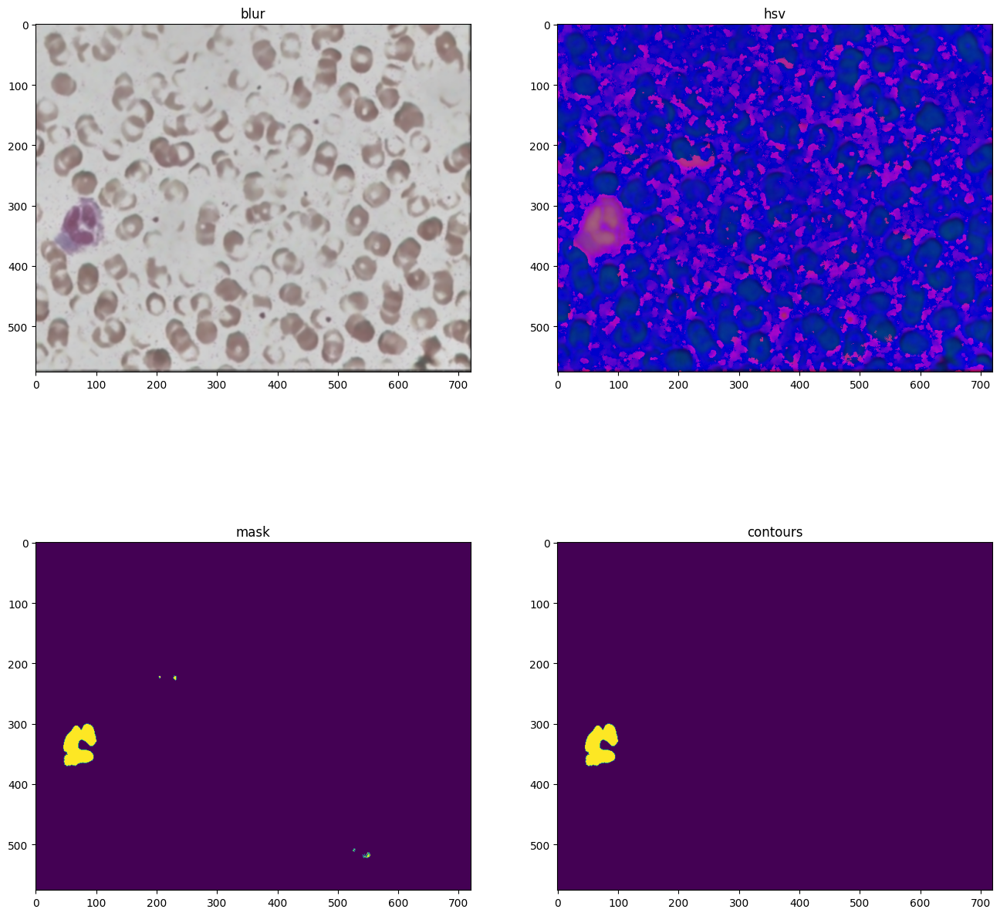

In [42]:
# plotting images
plt.figure(figsize=(16, 16))

# orginal image
plt.subplot(2,2,1)
plt.imshow(blur[55].astype(np.uint8))
plt.title("blur")

# brightned image
plt.subplot(2,2,2)
plt.imshow(hsv[55].astype(np.uint8))
plt.title("hsv")

# orginal image
plt.subplot(2,2,3)
plt.imshow(masked[55].astype(np.uint8))
plt.title("mask")

# brightned image
plt.subplot(2,2,4)
plt.imshow(contours[55].astype(np.uint8))
plt.title("contours")

Text(0.5, 1.0, 'output')

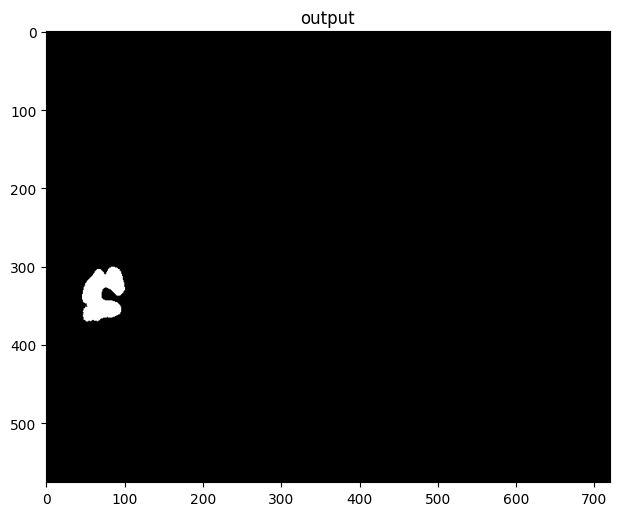

In [43]:
# final output
plt.figure(figsize=(16, 16))

# orginal image
plt.subplot(2,2,1)
plt.imshow(output[55].astype(np.uint8),cmap='gray')
plt.title("output")

Text(0.5, 1.0, 'remove noise')

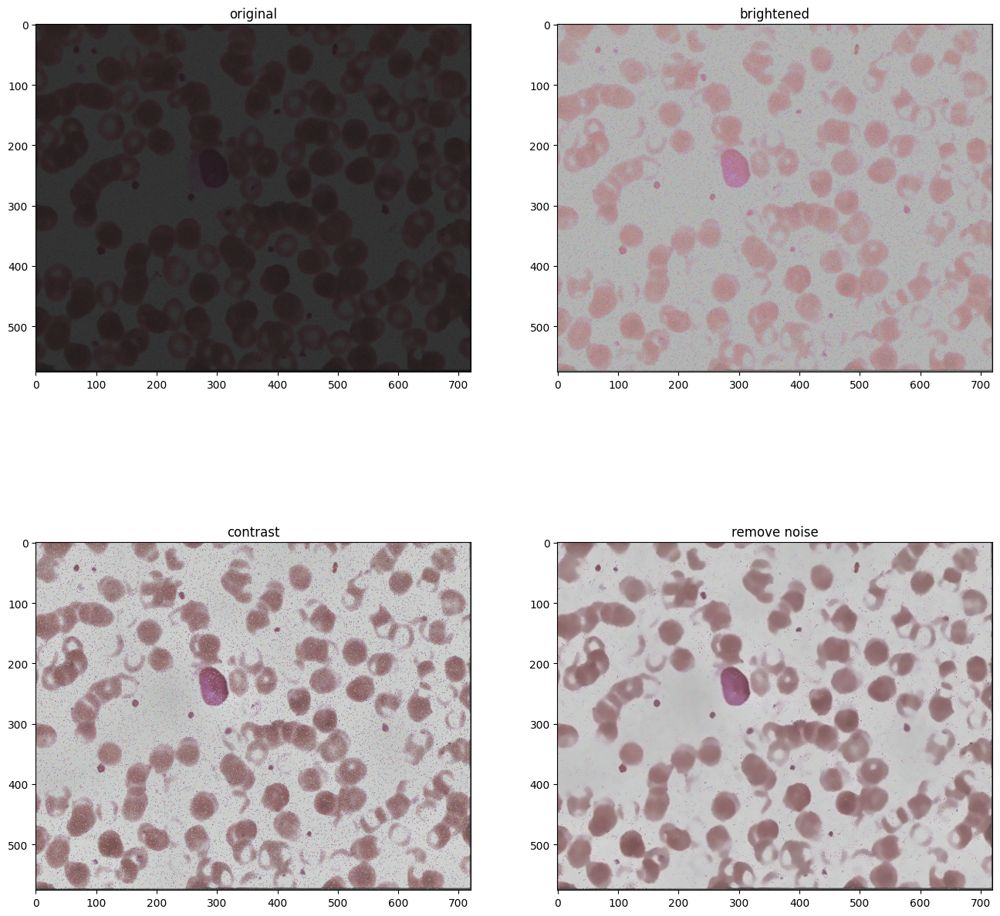

In [44]:
# displaying state of image in each step
# plotting images
plt.figure(figsize=(16, 16))

# orginal image
plt.subplot(2,2,1)
plt.imshow(images[153])
plt.title("original")

# brightned image
plt.subplot(2,2,2)
plt.imshow(brigthened[153].astype(np.uint8))
plt.title("brightened")

# orginal image
plt.subplot(2,2,3)
plt.imshow(contrast[153])
plt.title("contrast")

# brightned image
plt.subplot(2,2,4)
plt.imshow(removed_noise[153].astype(np.uint8))
plt.title("remove noise")

Text(0.5, 1.0, 'contours')

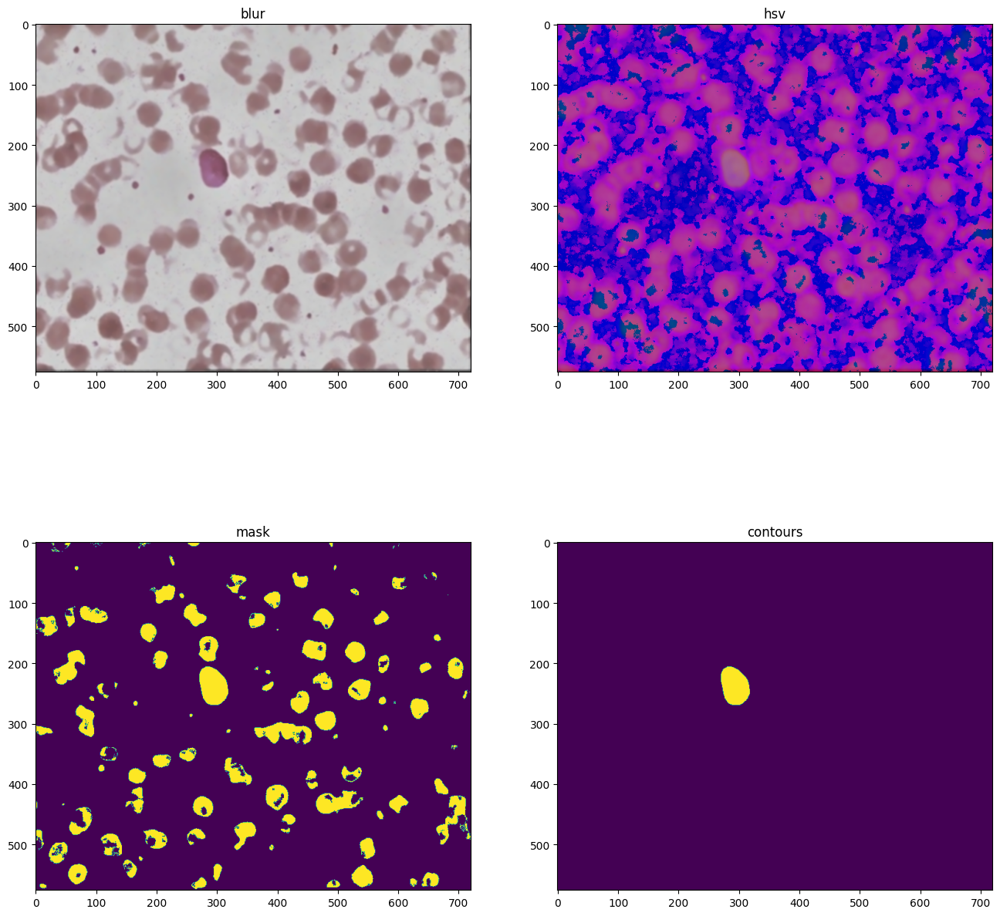

In [45]:
# plotting images
plt.figure(figsize=(16, 16))

# orginal image
plt.subplot(2,2,1)
plt.imshow(blur[153].astype(np.uint8))
plt.title("blur")

# brightned image
plt.subplot(2,2,2)
plt.imshow(hsv[153].astype(np.uint8))
plt.title("hsv")

# orginal image
plt.subplot(2,2,3)
plt.imshow(masked[153].astype(np.uint8))
plt.title("mask")

# brightned image
plt.subplot(2,2,4)
plt.imshow(contours[153].astype(np.uint8))
plt.title("contours")

Text(0.5, 1.0, 'output')

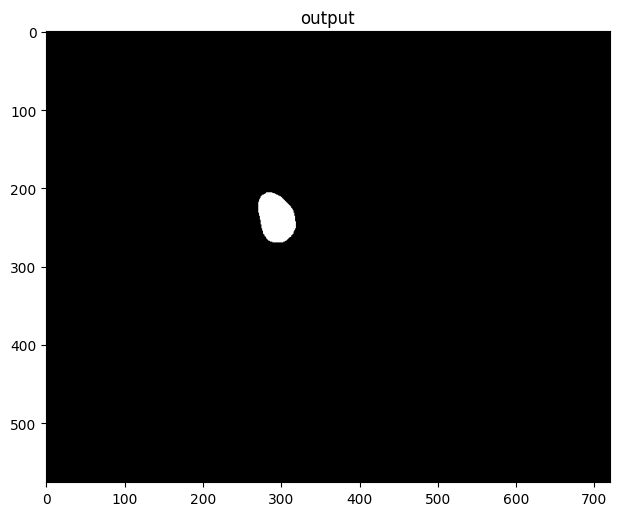

In [46]:
# final output
plt.figure(figsize=(16, 16))

# orginal image
plt.subplot(2,2,1)
plt.imshow(output[153].astype(np.uint8),cmap='gray')
plt.title("output")

Text(0.5, 1.0, 'remove noise')

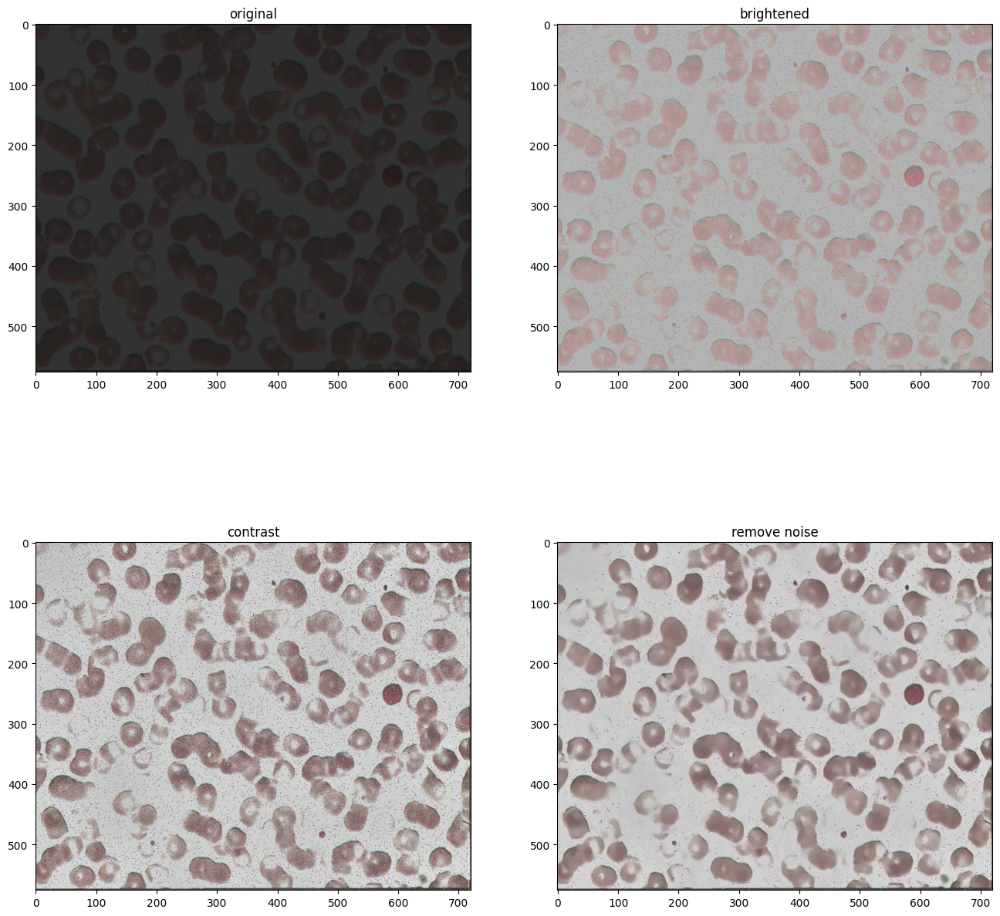

In [47]:
# displaying state of image in each step
# plotting images
plt.figure(figsize=(16, 16))

# orginal image
plt.subplot(2,2,1)
plt.imshow(images[93])
plt.title("original")

# brightned image
plt.subplot(2,2,2)
plt.imshow(brigthened[93].astype(np.uint8))
plt.title("brightened")

# orginal image
plt.subplot(2,2,3)
plt.imshow(contrast[93])
plt.title("contrast")

# brightned image
plt.subplot(2,2,4)
plt.imshow(removed_noise[93].astype(np.uint8))
plt.title("remove noise")

Text(0.5, 1.0, 'contours')

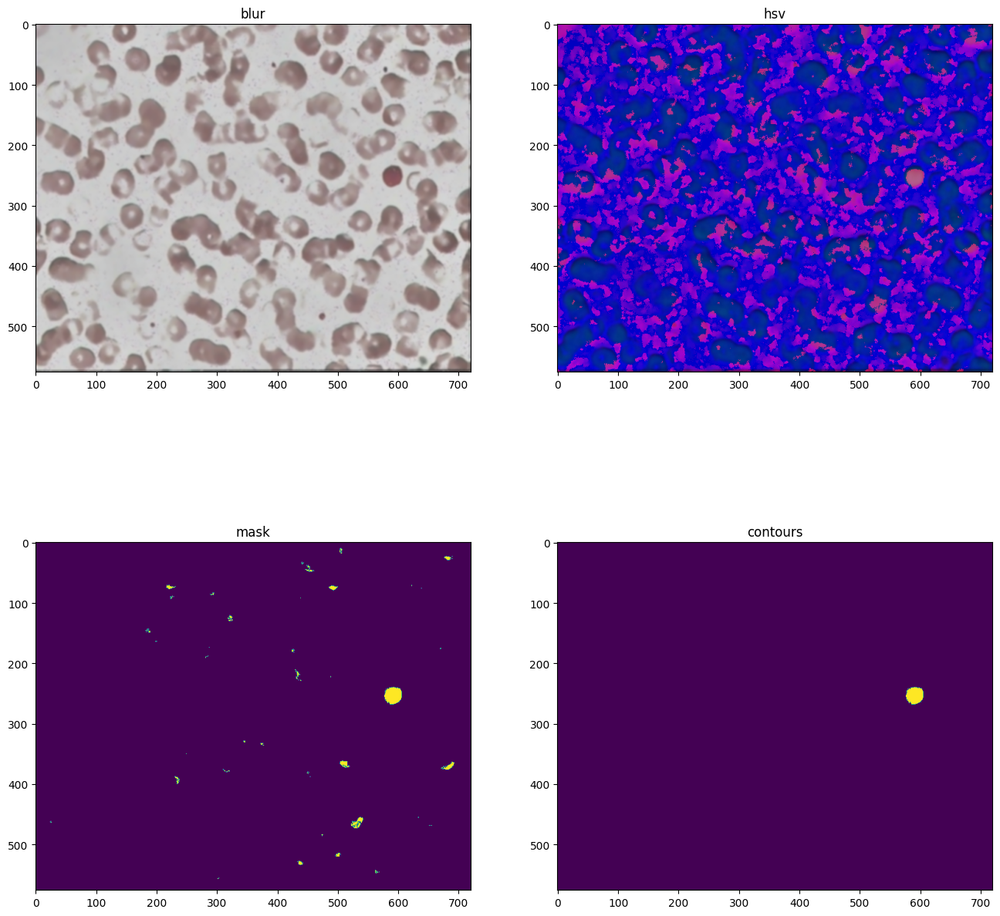

In [48]:
# plotting images
plt.figure(figsize=(16, 16))

# orginal image
plt.subplot(2,2,1)
plt.imshow(blur[93].astype(np.uint8))
plt.title("blur")

# brightned image
plt.subplot(2,2,2)
plt.imshow(hsv[93].astype(np.uint8))
plt.title("hsv")

# orginal image
plt.subplot(2,2,3)
plt.imshow(masked[93].astype(np.uint8))
plt.title("mask")

# brightned image
plt.subplot(2,2,4)
plt.imshow(contours[93].astype(np.uint8))
plt.title("contours")

Text(0.5, 1.0, 'output')

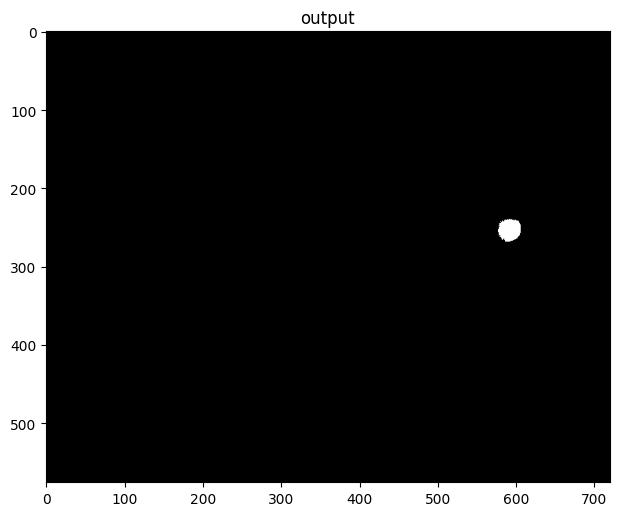

In [49]:
# final output
plt.figure(figsize=(16, 16))

# orginal image
plt.subplot(2,2,1)
plt.imshow(output[93].astype(np.uint8),cmap='gray')
plt.title("output")